<a href="https://colab.research.google.com/github/m365i/hw-py-deep-learning/blob/main/deep_learning_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

to skip cell executin use:  
%%script echo skipping

to disable output of cell use:  
%%capture


Requirements

In [ ]:
%%capture

! wget -nc https://github.com/OlafenwaMoses/ImageAI/releases/download/essential-v4/pretrained-yolov3.h5

! pip install keras==2.4.3 numpy==1.19.3 pillow==7.0.0 scipy==1.4.1 h5py==2.10.0 matplotlib==3.3.2 opencv-python keras-resnet==0.2.0 tensorflow-gpu==2.4.0
! pip install imageai --upgrade

! wget -nc https://github.com/OlafenwaMoses/AppleDetection/releases/download/v1/detection_model-ex-028--loss-8.723.h5

! pip install easyocr

! wget -nc https://github.com/OlafenwaMoses/ImageAI/releases/download/essentials-v5/resnet50_coco_best_v2.1.0.h5

! pip install yt-dlp

! pip install --upgrade numpy
! pip install pyyaml==5.1
! pip install 'git+https://github.com/facebookresearch/detectron2.git'

exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Dataset

In [ ]:
! mkdir train

! gdown --id 1l15qvILHCURvGzQbxxI7KsZQxMk2TyaO # dataset from https://www.kaggle.com/datasets/andrewmvd/car-plate-detection
! unzip car-plate-detection.zip -d train > /dev/null
! sed -i 's/licence/license/g' train/annotations/*

! gdown --id 1N5Lg0egALaF-2Eac73rzDF-n34xqJ9wx
! unzip train-license-eli.zip > /dev/null

! gdown --id 1fjK0xJrVmGEjNOrei6ZjMb6FfNLU0y-8
! unzip -o train-zohar.zip > /dev/null

! mkdir car_plate_dataset
! mv train car_plate_dataset
! mkdir car_plate_dataset/validation car_plate_dataset/validation/images car_plate_dataset/validation/annotations

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1l15qvILHCURvGzQbxxI7KsZQxMk2TyaO
To: /content/car-plate-detection.zip
100% 213M/213M [00:05<00:00, 37.9MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1N5Lg0egALaF-2Eac73rzDF-n34xqJ9wx
To: /content/train-license-eli.zip
100% 9.71M/9.71M [00:00<00:00, 14.9MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Down

Train YOLOv3 model on dataset

In [ ]:
from imageai.Detection.Custom import DetectionModelTrainer

trainer = DetectionModelTrainer()
trainer.setModelTypeAsYOLOv3()
trainer.setDataDirectory(data_directory="car_plate_dataset")
trainer.setTrainConfig(object_names_array=["license"], batch_size=6, num_experiments=20, train_from_pretrained_model="pretrained-yolov3.h5")
trainer.trainModel()

Generating anchor boxes for training images and annotation...
Average IOU for 9 anchors: 0.73
Anchor Boxes generated.
Detection configuration saved in  car_plate_dataset/json/detection_config.json
Evaluating over 0 samples taken from car_plate_dataset/validation
Training over 716 samples  given at car_plate_dataset/train
Training on: 	['license']
Training with Batch Size:  6
Number of Training Samples:  716
Number of Validation Samples:  0
Number of Experiments:  20
Training with transfer learning from pretrained Model


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


Epoch 1/20
960/960 [==============================] - 585s 595ms/step - loss: 53.7738 - yolo_layer_loss: 5.7792 - yolo_layer_1_loss: 13.3941 - yolo_layer_2_loss: 23.8152
Epoch 2/20
960/960 [==============================] - 566s 589ms/step - loss: 19.3401 - yolo_layer_loss: 2.0737 - yolo_layer_1_loss: 4.4890 - yolo_layer_2_loss: 6.6046
Epoch 3/20
960/960 [==============================] - 554s 577ms/step - loss: 17.3786 - yolo_layer_loss: 2.5249 - yolo_layer_1_loss: 3.9078 - yolo_layer_2_loss: 5.5712
Epoch 4/20
960/960 [==============================] - 567s 590ms/step - loss: 16.4874 - yolo_layer_loss: 2.7491 - yolo_layer_1_loss: 3.5107 - yolo_layer_2_loss: 5.2838
Epoch 5/20
960/960 [==============================] - 537s 558ms/step - loss: 14.6367 - yolo_layer_loss: 1.8780 - yolo_layer_1_loss: 3.1135 - yolo_layer_2_loss: 5.0107
Epoch 6/20
960/960 [==============================] - 547s 569ms/step - loss: 14.6256 - yolo_layer_loss: 2.4012 - yolo_layer_1_loss: 3.0834 - yolo_layer_2_los

Pre trained model

In [ ]:
#%%script echo skipping
# save
import glob
! rm -rf car_plate_dataset/train car_plate_dataset/validation car_plate_dataset/cache
model_file_name = sorted(glob.glob("./car_plate_dataset/models/detection_model-ex-*--loss-*.h5"))[-1]
! mv $model_file_name car_plate_dataset/detection_model.h5
! rm -rf car_plate_dataset/models/*
! mv car_plate_dataset/detection_model.h5 car_plate_dataset/models/detection_model.h5
! zip -r trained_model.zip car_plate_dataset
! cp trained_model.zip drive/MyDrive/trained_model.zip

  adding: car_plate_dataset/ (stored 0%)
  adding: car_plate_dataset/json/ (stored 0%)
  adding: car_plate_dataset/json/detection_config.json (deflated 70%)
  adding: car_plate_dataset/models/ (stored 0%)
  adding: car_plate_dataset/models/detection_model.h5 (deflated 7%)
  adding: car_plate_dataset/logs/ (stored 0%)
  adding: car_plate_dataset/logs/train/ (stored 0%)
  adding: car_plate_dataset/logs/train/events.out.tfevents.1662921861.76519733eebc.71.5455.v2 (deflated 67%)
  adding: car_plate_dataset/logs/train/plugins/ (stored 0%)
  adding: car_plate_dataset/logs/train/plugins/profile/ (stored 0%)
  adding: car_plate_dataset/logs/train/plugins/profile/2022_09_11_18_44_37/ (stored 0%)
  adding: car_plate_dataset/logs/train/plugins/profile/2022_09_11_18_44_37/76519733eebc.overview_page.pb (deflated 58%)
  adding: car_plate_dataset/logs/train/plugins/profile/2022_09_11_18_44_37/76519733eebc.tensorflow_stats.pb (deflated 64%)
  adding: car_plate_dataset/logs/train/plugins/profile/2022_0

In [ ]:
%%script echo skipping
# load
! gdown --id 1iTIsUukmxD5oDeJ7vd9bRGRtizSBqgOQ
! unzip trained_model.zip > /dev/null

skipping


Test on an image

In [ ]:
from imageai.Detection.Custom import CustomObjectDetection
import glob

detector = CustomObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath(detection_model_path="./car_plate_dataset/models/detection_model.h5")
detector.setJsonPath(configuration_json="./car_plate_dataset/json/detection_config.json")
detector.loadModel()

In [ ]:
from IPython.display import Image

def test_image(): # test image file name must be image.jpg
  detections = detector.detectObjectsFromImage(input_image="image.jpg", minimum_percentage_probability=60, output_image_path="image-new.jpg")

  for detection in detections:
      print(detection["name"], " : ", detection["percentage_probability"], " : ", detection["box_points"])

  return Image(filename='image-new.jpg')

--2022-09-11 21:48:35--  https://img.yad2.co.il/Pic/202208/11/1_1/o/y2_1_03526_20220811171043.jpeg
Resolving img.yad2.co.il (img.yad2.co.il)... 13.224.250.9, 13.224.250.126, 13.224.250.40, ...
Connecting to img.yad2.co.il (img.yad2.co.il)|13.224.250.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 49109 (48K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>]  47.96K   263KB/s    in 0.2s    

2022-09-11 21:48:36 (263 KB/s) - ‘image.jpg’ saved [49109/49109]



/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3504: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


license  :  60.62689423561096  :  [429, 285, 535, 330]


/usr/local/lib/python3.7/dist-packages/imageai/Detection/Custom/__init__.py:1248: RuntimeWarning: overflow encountered in exp
  return 1. / (1. + np.exp(-x))


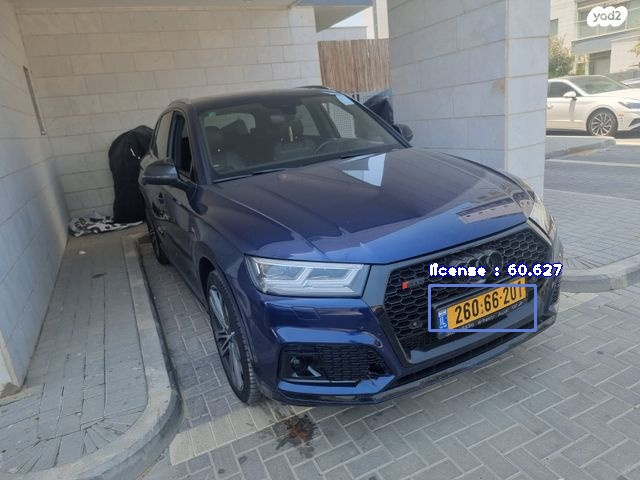

In [ ]:
! wget -O image.jpg https://img.yad2.co.il/Pic/202208/11/1_1/o/y2_1_03526_20220811171043.jpeg
test_image()

Detect license plate number

In [ ]:
import easyocr

reader = easyocr.Reader(['en']) # if raises an error - try to run the cell again
result = reader.readtext('image.jpg')

In [ ]:
import re

def search_license_plate(results):
  for box, txt, confidance in results:
    license = re.sub('[^\d]', '', txt)
    if len(license) != 7 and len(license) != 8:
      continue
    print("license plate:", license)

for i in result:
  print(i)
search_license_plate(result)

([[582, 3], [627, 3], [627, 28], [582, 28]], '{yadz ,', 0.06665533881709952)
([[442.7701175612585, 303.99310580513264], [526.3589550164672, 272.14653534420427], [535.2298824387415, 299.00689419486736], [451.6410449835327, 330.85346465579573]], '[28066201', 0.3670799883865413)
license plate: 28066201


Another test on an image - this time with non-israeli license plate

--2022-09-11 21:51:32--  https://img.yad2.co.il/Pic/202208/30/1_3/o/y2_1_07344_20220830133319.jpeg
Resolving img.yad2.co.il (img.yad2.co.il)... 13.224.250.88, 13.224.250.9, 13.224.250.126, ...
Connecting to img.yad2.co.il (img.yad2.co.il)|13.224.250.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 127693 (125K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>] 124.70K   341KB/s    in 0.4s    

2022-09-11 21:51:34 (341 KB/s) - ‘image.jpg’ saved [127693/127693]

license  :  76.04689002037048  :  [522, 296, 633, 353]


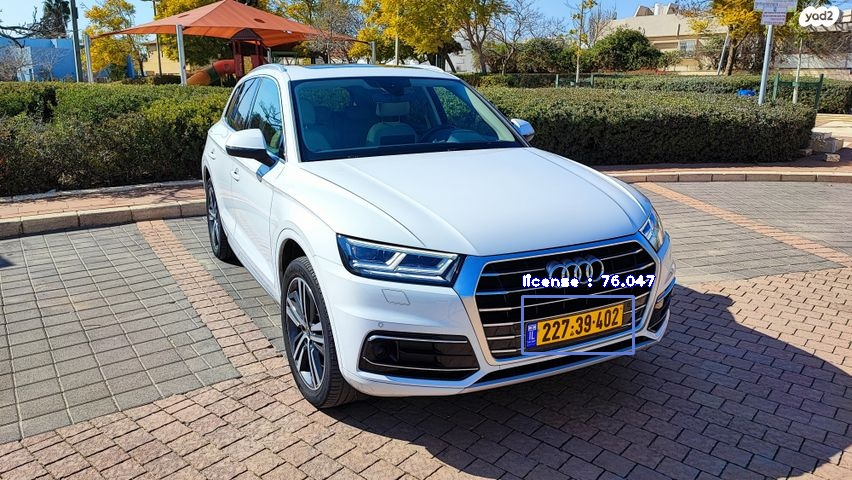

In [ ]:
! wget -O image.jpg https://img.yad2.co.il/Pic/202208/30/1_3/o/y2_1_07344_20220830133319.jpeg
test_image()

Test on video

In [ ]:
from IPython.display import HTML
from base64 import b64encode
 
def show_video(video_path, video_width = 600):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

In [ ]:
%%capture
! yt-dlp -f 'bv*+ba' https://www.youtube.com/watch?v=IJZNB1XjAP0 -o 'video' # download a video from youtube
! ffmpeg -ss 00:00:10.0 -i video.webm -t 00:00:25.00 out.mp4 # crop the video

In [ ]:
show_video("out.mp4")

In [ ]:
from imageai.Detection.Custom import CustomVideoObjectDetection

video_detector = CustomVideoObjectDetection()
video_detector.setModelTypeAsYOLOv3()
video_detector.setModelPath(detection_model_path="./car_plate_dataset/models/detection_model.h5")
video_detector.setJsonPath(configuration_json="./car_plate_dataset/json/detection_config.json")
video_detector.loadModel()

In [ ]:
%%capture
video_detector.detectObjectsFromVideo(input_file_path="out.mp4",
                                output_file_path="result_video.mp4",
                                frames_per_second=20,
                                minimum_percentage_probability=40,
                                log_progress=True)
! ffmpeg -i result_video.mp4.avi -c:v libx264 -vf "fps=15,format=yuv420p" result_video.mp4 # convert to a format that can be displayed in colab

In [ ]:
show_video("result_video.mp4")

Compare training YOLOv3 vs facebook detectron2 results

Dataset

In [ ]:
! gdown --id 1X7yWp9eF2mKFdHm3UB-2p3qRRtpp5uIU
! unzip train-detectron.zip > /dev/null
! sed -i 's/..\\\\images\\\\/images\//g' train/annotations/runs/labelme2coco/dataset.json

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1X7yWp9eF2mKFdHm3UB-2p3qRRtpp5uIU
To: /content/train-detectron.zip
100% 19.1M/19.1M [00:00<00:00, 35.3MB/s]


Training

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os, json, cv2, random
from detectron2.utils.visualizer import Visualizer
from detectron2.engine import DefaultPredictor
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode
from google.colab.patches import cv2_imshow

In [ ]:
register_coco_instances("license", {}, "train/annotations/runs/labelme2coco/dataset.json", "train")
license_metadata = MetadataCatalog.get("license")

In [ ]:
# using paraeters taken from an example here: https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("license",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[09/11 21:55:44 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:11, 15.7MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[09/11 21:55:55 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/11 21:56:05 d2.utils.events]:  eta: 0:01:58  iter: 19  total_loss: 1.61  loss_cls: 0.7326  loss_box_reg: 0.01768  loss_mask: 0.693  loss_rpn_cls: 0.1168  loss_rpn_loc: 0.01136  time: 0.4214  data_time: 0.0246  lr: 1.6068e-05  max_mem: 2892M
[09/11 21:56:14 d2.utils.events]:  eta: 0:01:52  iter: 39  total_loss: 1.338  loss_cls: 0.5092  loss_box_reg: 0.01604  loss_mask: 0.6516  loss_rpn_cls: 0.07466  loss_rpn_loc: 0.01109  time: 0.4282  data_time: 0.0119  lr: 3.2718e-05  max_mem: 2892M
[09/11 21:56:22 d2.utils.events]:  eta: 0:01:39  iter: 59  total_loss: 1.015  loss_cls: 0.2692  loss_box_reg: 0.04954  loss_mask: 0.5647  loss_rpn_cls: 0.07145  loss_rpn_loc: 0.009621  time: 0.4201  data_time: 0.0106  lr: 4.9367e-05  max_mem: 2892M
[09/11 21:56:31 d2.utils.events]:  eta: 0:01:33  iter: 79  total_loss: 0.8938  loss_cls: 0.2068  loss_box_reg: 0.143  loss_mask: 0.4847  loss_rpn_cls: 0.02846  loss_rpn_loc: 0.00682  time: 0.4252  data_time: 0.0096  lr: 6.6017e-05  max_mem: 2892M
[09/11 21:5

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[09/11 21:58:14 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Test on an image

--2022-09-11 21:58:14--  https://img.yad2.co.il/Pic/202208/11/1_1/o/y2_1_03526_20220811171043.jpeg
Resolving img.yad2.co.il (img.yad2.co.il)... 54.192.150.46, 54.192.150.33, 54.192.150.15, ...
Connecting to img.yad2.co.il (img.yad2.co.il)|54.192.150.46|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 49109 (48K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>]  47.96K  --.-KB/s    in 0.002s  

2022-09-11 21:58:14 (30.9 MB/s) - ‘image.jpg’ saved [49109/49109]



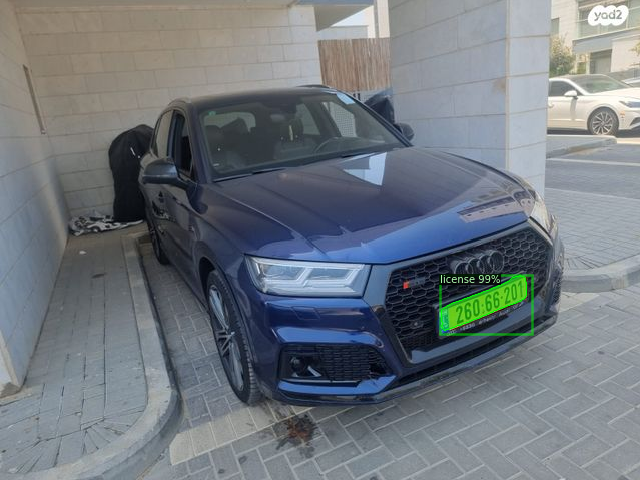

In [ ]:
! wget -O image.jpg https://img.yad2.co.il/Pic/202208/11/1_1/o/y2_1_03526_20220811171043.jpeg
im = cv2.imread('image.jpg')
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1], metadata=license_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])